In [60]:
import keras
import tensorflow as tf

In [61]:
import os
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from glob import glob
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

In [62]:
# training data from original first 60
base_dir = Path(r'e:/Google Drive/research\projects/utica/model_save/2017/data/train')
mask_dir = base_dir.joinpath('mask')
train_image_dir = base_dir.joinpath('images')
trees_mask_dir = mask_dir.joinpath('trees')
building_mask_dir = mask_dir.joinpath('building')
pavement_mask_dir = mask_dir.joinpath('pavement')

In [63]:
I, N, M = 60, 128, 128

In [64]:
os.listdir(mask_dir)

['building', 'desktop.ini', 'pavement', 'trees']

In [65]:
trees_mask_dir

WindowsPath('e:/Google Drive/research/projects/utica/model_save/2017/data/train/mask/trees')

In [66]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [67]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [68]:
test = gdal.Open(r'e:/Google Drive/research/projects/utica/model_save/2017/data/train/images/train_1.tif', gdal.GA_ReadOnly)

In [69]:
test3 = test.GetRasterBand(1).ReadAsArray()

In [70]:
test2 = test.GetRasterBand(2).ReadAsArray()

In [71]:
test4 = test.GetRasterBand(3).ReadAsArray()

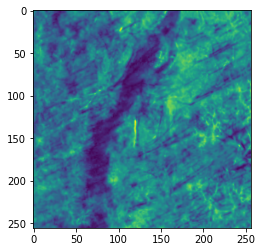

In [72]:
plt.imshow(test2)

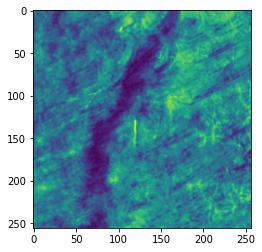

In [73]:
plt.imshow(test3)

In [74]:
V = 3

In [75]:

def load_image_no_trim(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [76]:
def load_image_large(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()[81:209,81:209]

In [77]:
import typing as t

def load_image_rgb(path: str, shape: t.Tuple[int,int,int], dtype) -> np.ndarray:
    image = np.zeros(shape = shape, dtype=dtype)
    ds= gdal.Open(path, gdal.GA_ReadOnly)
    for i in (1, 2, 3):
        image[:, :, i-1] = ds.GetRasterBand(i).ReadAsArray()
    return image

In [78]:
def load_image_rgb_large(path: str, shape: t.Tuple[int,int,int], dtype) -> np.ndarray:
    image = np.zeros(shape = shape, dtype=dtype)
    ds= gdal.Open(path, gdal.GA_ReadOnly)
    for i in (1, 2, 3):
        image[:, :, i-1] = ds.GetRasterBand(i).ReadAsArray()[81:209, 81:209]
    return image

In [79]:
def sorted_paths(img_dir: Path):
    return sorted(glob(img_dir.joinpath('*.tif').as_posix()), key=img_number)

In [80]:
def load_stack_safely(shape, dtype, img_dir, prefix):
    """
    Load a stack of images from disk into an ndarray.

    Performs the load potentially several times, to ensure that values
    stabilize. Google seems to be...tricky...
    """
    last_sum = 0
    while True:
        stack = np.zeros(shape=shape, dtype=dtype)
        for i in range(shape[0]):
            image_path = make_path(img_dir, prefix, i + 1)
            if not os.path.isfile(image_path):
                print("skipping", image_path)
                continue
            stack[i, :, :] = load_image_no_trim(image_path)
        if stack.sum() == last_sum:
            break
        last_sum = stack.sum()
    return stack

In [81]:
def load_stack_safely_large(shape, dtype, img_dir, prefix):
    """
    Load a stack of images from disk into an ndarray.

    Performs the load potentially several times, to ensure that values
    stabilize. Google seems to be...tricky...
    """
    last_sum = 0
    while True:
        stack = np.zeros(shape=shape, dtype=dtype)
        for i in range(shape[0]):
            image_path = make_path(img_dir, prefix, i + 1)
            if not os.path.isfile(image_path):
                print("skipping", image_path)
                continue
            stack[i, :, :] = load_image_large(image_path)
        if stack.sum() == last_sum:
            break
        last_sum = stack.sum()
    return stack

In [82]:
def load_stack_safely_rgb_large(shape, dtype, img_dir, prefix):
    """
    Load a stack of images from disk into an ndarray.

    Performs the load potentially several times, to ensure that values
    stabilize. Google seems to be...tricky...
    """
    last_sum = 0
    while True:
        stack = np.zeros(shape=shape, dtype=dtype)
        for i in range(shape[0]):
            image_path = make_path(img_dir, prefix, i + 1)
            if not os.path.isfile(image_path):
                print("skipping", image_path)
                continue
            stack[i, : , : , : ] = load_image_rgb_large(image_path, (shape[1], shape[2], shape[3]), dtype)
        if stack.sum() == last_sum:
            break
        last_sum = stack.sum()
    return stack

In [83]:
def load_stack_safely_rgb(shape, dtype, img_dir, prefix):
    """
    Load a stack of images from disk into an ndarray.

    Performs the load potentially several times, to ensure that values
    stabilize. Google seems to be...tricky...
    """
    last_sum = 0
    while True:
        stack = np.zeros(shape=shape, dtype=dtype)
        for i in range(shape[0]):
            image_path = make_path(img_dir, prefix, i + 1)
            if not os.path.isfile(image_path):
                print("skipping", image_path)
                continue
            stack[i, : , : , : ] = load_image_rgb(image_path, (shape[1], shape[2], shape[3]), dtype)
        if stack.sum() == last_sum:
            break
        last_sum = stack.sum()
    return stack

In [84]:

train_imagesO = load_stack_safely_rgb_large((I, N, M, V), np.float32, train_image_dir, "train")

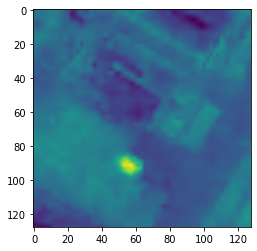

In [85]:
plt.imshow(train_images[20,:,:,0]- train_images[20,:,:,2])

In [86]:

tree_masksO = load_stack_safely_large((I, N, M), np.int8, trees_mask_dir, "tree_mask")
building_masksO = load_stack_safely_large((I, N, M), np.int8, building_mask_dir, "building_mask")
pavement_masksO = load_stack_safely_large((I, N, M), np.int8, pavement_mask_dir, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_3.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_5.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_9.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_10.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_15.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_17.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_30.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_31.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\train\mask\trees\tree_mask_34.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\da

In [87]:
# Use small traced images for last 40
base_dirS = Path(r'e:\Google Drive\research\projects\utica\model_save\2017\data_128\train')
mask_dirS = base_dirS.joinpath('mask')
train_image_dirS = base_dirS.joinpath('images')
trees_mask_dirS = mask_dirS.joinpath('trees')
building_mask_dirS = mask_dirS.joinpath('building')
pavement_mask_dirS = mask_dirS.joinpath('pavement')

In [88]:
K, N, M = 40, 128, 128
tree_masksS = load_stack_safely((K, N, M), np.int8, trees_mask_dirS, "tree_mask")
building_masksS = load_stack_safely((K, N, M), np.int8, building_mask_dirS, "building_mask")
pavement_masksS = load_stack_safely((K, N, M), np.int8, pavement_mask_dirS, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_7.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_9.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_17.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_24.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_25.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_32.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_36.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_40.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data_128\train\mask\trees\tree_mask_7.tif
skipping e:\Google Drive\resear

In [89]:
train_imagesS = load_stack_safely_rgb((K, N, M, V), np.float32, train_image_dirS, "train")

In [92]:
train_images = np.zeros((100,128,128,3))
tree_masks =  np.zeros((100,128,128))
building_masks =  np.zeros((100,128,128))
pavement_masks =  np.zeros((100,128,128))

In [93]:
tree_masks[0:60,:,:] = tree_masksO
tree_masks[60:100,:,:] = tree_masksS
building_masks[0:60,:,:] = building_masksO
building_masks[60:100,:,:] = building_masksS
pavement_masks[0:60,:,:] = pavement_masksO
pavement_masks[60:100,:,:] = pavement_masksS

In [94]:
train_images[0:60,:,:,:] = train_imagesO
train_images[60:100,:,:,:] = train_imagesS

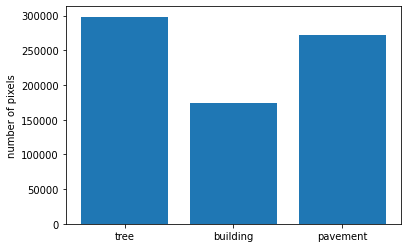

In [95]:
fig, ax = plt.subplots()
ax.bar(range(3), [tree_masks.sum(), building_masks.sum(), pavement_masks.sum()])
ax.set_xticks((0, 1, 2))
ax.set_xticklabels(('tree', 'building', 'pavement'))
plt.ylabel('number of pixels')
plt.show()

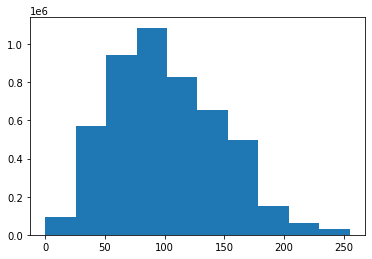

In [96]:
plt.hist(train_images.flatten())
plt.show()

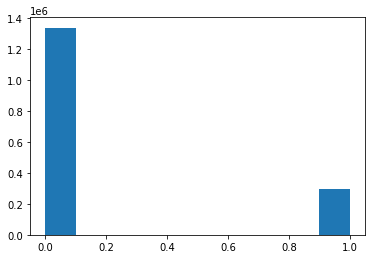

In [97]:
plt.hist(tree_masks.flatten())
plt.show()

In [98]:
model = satellite_unet(
    (N, M, 3),
    3,
    # dropout_type="spatial"
)

In [99]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(), 
    #optimizer=SGD(lr=0.01, momentum=0.99),
    loss='binary_crossentropy',
    #loss=jaccard_distance,
    metrics=[iou, iou_thresholded],
    
)

In [101]:
Y = np.zeros(shape=(100, N, M, 3), dtype=np.int8)
Y[:, :, :, 0] = tree_masks
Y[:, :, :, 1] = building_masks
Y[:, :, :, 2] = pavement_masks

In [102]:
Y.shape, tree_masks.shape

((100, 128, 128, 3), (100, 128, 128))

In [103]:
history = model.fit(
    train_images.reshape(100, N, M, 3),
    Y,
    epochs=150,
)

Epoch 1/150
4/4 [==============================] - 14s 3s/step - loss: 0.7122 - iou: 0.1962 - iou_thresholded: 0.2698
Epoch 2/150
4/4 [==============================] - 12s 3s/step - loss: 0.3832 - iou: 0.1965 - iou_thresholded: 0.2729
Epoch 3/150
4/4 [==============================] - 12s 3s/step - loss: 0.3069 - iou: 0.2384 - iou_thresholded: 0.2996
Epoch 4/150
4/4 [==============================] - 12s 3s/step - loss: 0.2669 - iou: 0.2787 - iou_thresholded: 0.3350
Epoch 5/150
4/4 [==============================] - 12s 3s/step - loss: 0.3101 - iou: 0.2910 - iou_thresholded: 0.3559
Epoch 6/150
4/4 [==============================] - 12s 3s/step - loss: 0.2610 - iou: 0.3192 - iou_thresholded: 0.4073
Epoch 7/150
4/4 [==============================] - 12s 3s/step - loss: 0.2629 - iou: 0.3053 - iou_thresholded: 0.3566
Epoch 8/150
4/4 [==============================] - 12s 3s/step - loss: 0.2409 - iou: 0.3545 - iou_thresholded: 0.4488
Epoch 9/150
4/4 [==============================] - 12s 3

4/4 [==============================] - 12s 3s/step - loss: 0.1856 - iou: 0.4850 - iou_thresholded: 0.6096
Epoch 70/150
4/4 [==============================] - 12s 3s/step - loss: 0.1814 - iou: 0.4370 - iou_thresholded: 0.5426
Epoch 71/150
4/4 [==============================] - 12s 3s/step - loss: 0.1565 - iou: 0.5109 - iou_thresholded: 0.6468
Epoch 72/150
4/4 [==============================] - 12s 3s/step - loss: 0.1553 - iou: 0.5494 - iou_thresholded: 0.6760
Epoch 73/150
4/4 [==============================] - 12s 3s/step - loss: 0.1597 - iou: 0.5293 - iou_thresholded: 0.6207
Epoch 74/150
4/4 [==============================] - 12s 3s/step - loss: 0.1569 - iou: 0.5134 - iou_thresholded: 0.6126
Epoch 75/150
4/4 [==============================] - 12s 3s/step - loss: 0.1480 - iou: 0.4845 - iou_thresholded: 0.6001
Epoch 76/150
4/4 [==============================] - 12s 3s/step - loss: 0.1630 - iou: 0.4294 - iou_thresholded: 0.5299
Epoch 77/150
4/4 [==============================] - 12s 3s/st

4/4 [==============================] - 12s 3s/step - loss: 0.1552 - iou: 0.5333 - iou_thresholded: 0.6194
Epoch 138/150
4/4 [==============================] - 12s 3s/step - loss: 0.1525 - iou: 0.5312 - iou_thresholded: 0.6330
Epoch 139/150
4/4 [==============================] - 12s 3s/step - loss: 0.1465 - iou: 0.5277 - iou_thresholded: 0.6875
Epoch 140/150
4/4 [==============================] - 12s 3s/step - loss: 0.1363 - iou: 0.5281 - iou_thresholded: 0.6639
Epoch 141/150
4/4 [==============================] - 12s 3s/step - loss: 0.1337 - iou: 0.5376 - iou_thresholded: 0.6586
Epoch 142/150
4/4 [==============================] - 12s 3s/step - loss: 0.1186 - iou: 0.5821 - iou_thresholded: 0.7037
Epoch 143/150
4/4 [==============================] - 12s 3s/step - loss: 0.1147 - iou: 0.6234 - iou_thresholded: 0.7293
Epoch 144/150
4/4 [==============================] - 12s 3s/step - loss: 0.1113 - iou: 0.6348 - iou_thresholded: 0.7426
Epoch 145/150
4/4 [==============================] - 1

In [104]:

modelsave_path = Path(r'e:\Google Drive\research\projects\utica\model_save\2017\model_128\saved_model256')

In [105]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: e:\Google Drive\research\projects\utica\model_save\2017\model_128\saved_model256\assets


In [107]:
Y_pred = model.predict(train_images.reshape(100, N, M, 3))

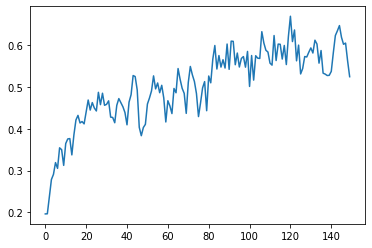

In [108]:
plt.plot(history.history['iou'])

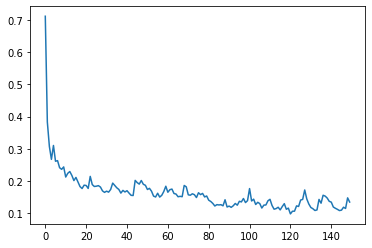

In [109]:
plt.plot(history.history['loss'])

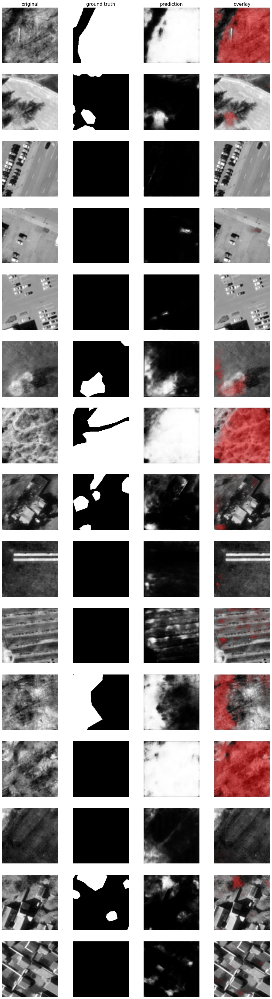

In [111]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(100, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=15
  )

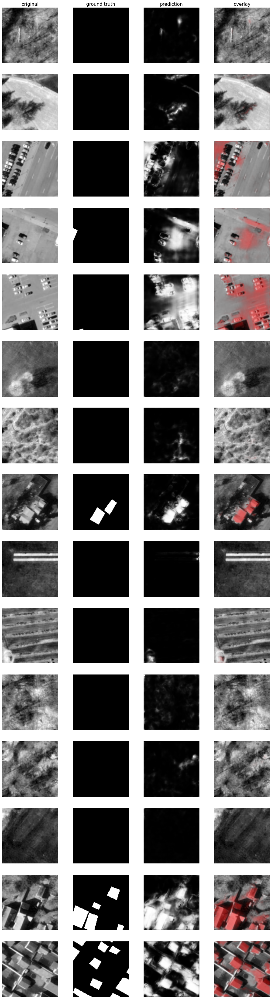

In [112]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(100, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=15
  )

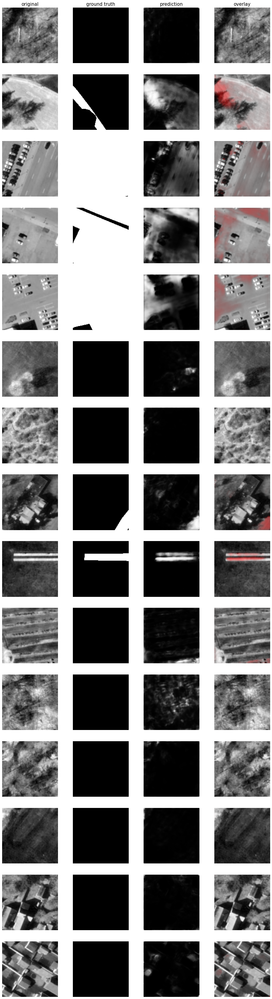

In [113]:
from keras_unet.utils import plot_imgs

plot_imgs(
    org_imgs=train_images.reshape(100, N, M, 3)[:,:,:,0], 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [114]:
# validation data
base_dirV = Path(r'e:/Google Drive/research/projects/utica/model_save/2017/data/valid')
mask_dirV = base_dirV.joinpath('mask')
train_image_dirV = base_dirV.joinpath('images')
trees_mask_dirV = mask_dirV.joinpath('trees')
building_mask_dirV = mask_dirV.joinpath('building')
pavement_mask_dirV = mask_dirV.joinpath('pavement')

In [122]:
K, N, M = 20, 128, 128

In [123]:
valid_images = load_stack_safely_rgb_large((K, N, M,V), np.float32, train_image_dirV, "valid")

In [124]:
valid_images.shape

(20, 128, 128, 3)

In [126]:

tree_valid = load_stack_safely_large((K, N, M), np.int8, trees_mask_dirV, "tree_mask")
building_valid = load_stack_safely_large((K, N, M), np.int8, building_mask_dirV, "building_mask")
pavement_valid = load_stack_safely_large((K, N, M), np.int8, pavement_mask_dirV, "pavement_mask")

skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_2.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_3.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_6.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_7.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_15.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_2.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_3.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_6.tif
skipping e:\Google Drive\research\projects\utica\model_save\2017\data\valid\mask\building\building_mask_7.tif
skipping 

In [127]:
Yvalid = np.zeros(shape=(K, N, M, 3), dtype=np.int8)
Yvalid[:, :, :, 0] = tree_valid
Yvalid[:, :, :, 1] = building_valid
Yvalid[:, :, :, 2] = pavement_valid

In [128]:
Y_valid = model.predict(valid_images.reshape(K, N, M, 3))

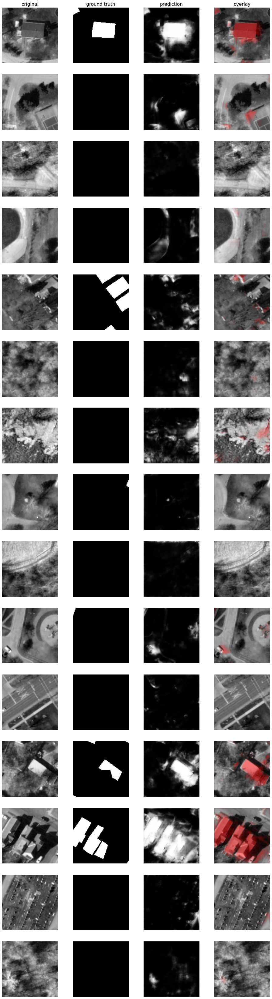

In [129]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 3)[:,:,:,0], 
    mask_imgs=Yvalid[:, :, :, 1], 
    pred_imgs=Y_valid[:, :, :, 1], 
    nm_img_to_plot=15
  )

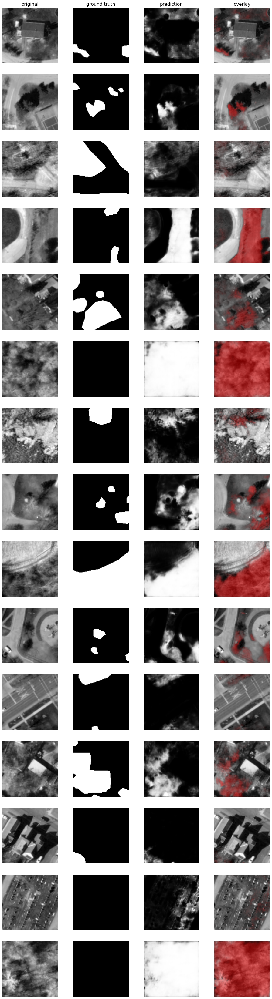

In [130]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 3)[:,:,:,0], 
    mask_imgs=Yvalid[:, :, :, 0], 
    pred_imgs=Y_valid[:, :, :, 0], 
    nm_img_to_plot=15
  )

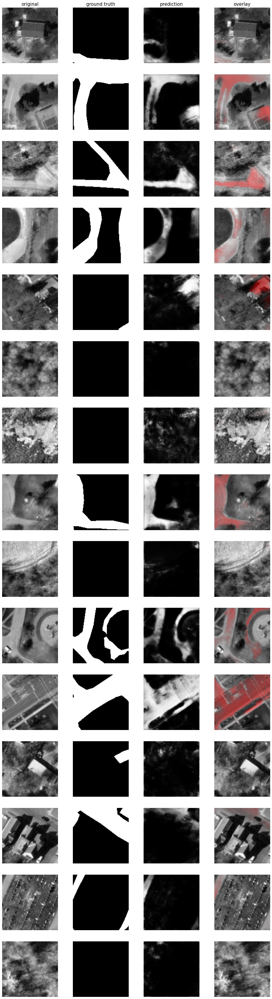

In [131]:
plot_imgs(
    org_imgs=valid_images.reshape(K, N, M, 3)[:,:,:,0], 
    mask_imgs=Yvalid[:, :, :, 2], 
    pred_imgs=Y_valid[:, :, :, 2], 
    nm_img_to_plot=15
  )

In [132]:
Y_valid[0,0,0,0]

0.008457214

In [133]:
treePredict = Y_valid[:,:,:,0]

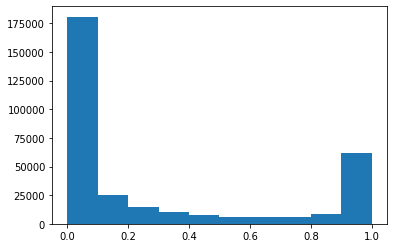

In [134]:
plt.hist(treePredict.flatten())
plt.show()

In [137]:
# prediction data
base_dirP = Path(r'E:/Google Drive/research/projects/utica/model_save/2017/img_tile_128/image')

In [140]:
J, N, M = 31720, 128, 128

In [141]:
predict_img = load_stack_safely_rgb((J, N, M,V), np.float32,base_dirP, "predict")

c:\users\hkropp\appdata\local\programs\python\python38\lib\site-packages\numpy\core\_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


In [142]:
predict_img.shape

(31720, 128, 128, 3)

In [143]:
Y_all = model.predict(predict_img.reshape(J, N, M, 3))

In [144]:
Y_all.shape

(31720, 128, 128, 3)

In [163]:
# prediction data offset 2 (25 pixels)

base_dirP2 = Path(r'e:/Google Drive/research/projects/utica/model_save/2017/img_tile_128/image_2')
predict_img2 = load_stack_safely_rgb((J, N, M, V), np.float32,base_dirP2, "predict")

In [164]:
Y_all2 = model.predict(predict_img2.reshape(J, N, M, 3))

In [165]:
Y_all2.shape

(31720, 128, 128, 3)

In [173]:
# prediction data offset 3 (100 pixels)
L, N, M = 30960, 128, 128
base_dirP3 = Path(r'e:/Google Drive/research/projects/utica/model_save/2017/img_tile_128/image_3')
predict_img3 = load_stack_safely_rgb((L, N, M, V), np.float32,base_dirP3, "predict")

In [169]:
Y_all3 = model.predict(predict_img3.reshape(L, N, M, 3))
Y_all3.shape

(7740, 256, 256, 3)

In [63]:
driver = gdal.GetDriverByName("GTiff")

In [64]:
driver.Register()

2

In [65]:
def load_stack_nt(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape=shape, dtype=dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image_no_trim(image_path)
    return stack

In [145]:
def save_predict_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(Y_valid[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [146]:
driver = gdal.GetDriverByName("GTiff")
driver.Register()

2

In [151]:
tree_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/2017/prediction_128/valid/tree'
save_predict_valid(nImg = 20,xdim= 128, ydim= 128,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = train_image_dirV , prefix_orig = "valid")

In [148]:
def save_predict_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outBuild = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outBuild.SetGeoTransform(gt)
        outBuild.SetProjection(pt)
        outBandBuild = outBuild.GetRasterBand(1)
        outBandBuild.WriteArray(Y_valid[i,:,:,1])
        outBandBuild.SetNoDataValue(np.nan)
        outBandBuild.FlushCache()
        outBandBuild = None
        outBuild = None

In [152]:
build_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/2017/prediction_128/valid/building'
save_predict_validB(nImg = 20,xdim= 128, ydim= 128,img_dir =build_valid_dir,prefix = "building_predict",orig_dir = train_image_dirV , prefix_orig = "valid")

In [157]:
def save_predict_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        build_ds = gdal.Open(orig_path)
        gt = build_ds.GetGeoTransform()
        pt = build_ds.GetProjection()
        outPave = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outPave.SetGeoTransform(gt)
        outPave.SetProjection(pt)
        outBandPave = outPave.GetRasterBand(1)
        outBandPave.WriteArray(Y_valid[i,:,:,2])
        outBandPave.SetNoDataValue(np.nan)
        outBandPave.FlushCache()
        outBandPave = None
        outPave = None

In [158]:
pave_valid_dir = r'e:/Google Drive/research\projects/utica/model_save/2017/prediction_128/valid/pavement'
save_predict_validP(nImg = 20,xdim= 128, ydim= 128,img_dir =pave_valid_dir,prefix = "pavement_predict",orig_dir = train_image_dirV , prefix_orig = "valid")

In [155]:
# save map prediction

def save_predict_build( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None


In [156]:
predict_build_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image/building'
save_predict_build(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_build_dir, prefix = "building",orig_dir = base_dirP , prefix_orig = "predict")

In [159]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [160]:
predict_tree_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image/tree'
save_predict_tree(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_tree_dir, prefix = "tree",orig_dir = base_dirP , prefix_orig = "predict")

In [161]:
def save_predict_pave( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [162]:
predict_pave_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image/pavement'
save_predict_pave(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_pave_dir, prefix = "pavement",orig_dir = base_dirP , prefix_orig = "predict")

In [167]:

# save map prediction

def save_predict_build2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [168]:
predict_build_dir2 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image_2/building'
save_predict_build2(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_build_dir2, prefix = "building",orig_dir = base_dirP2 , prefix_orig = "predict")

In [169]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [170]:
predict_tree_dir2 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image_2/tree'
save_predict_tree2(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_tree_dir2, prefix = "tree",orig_dir = base_dirP2 , prefix_orig = "predict")

In [171]:
def save_predict_pave2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [172]:

predict_pave_dir2 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_128/image_2/pavement'
save_predict_pave2(nImg = 31720,xdim= 128, ydim= 128,img_dir = predict_pave_dir2, prefix = "pavement",orig_dir = base_dirP2 , prefix_orig = "predict")

In [170]:
def save_predict_build3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [171]:
predict_build_dir3 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_256/image_3/building'
save_predict_build3(nImg = 7740,xdim= 256, ydim= 256,img_dir = predict_build_dir3, prefix = "building",orig_dir = base_dirP3 , prefix_orig = "predict")

In [172]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [173]:
predict_tree_dir3 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_256/image_3/tree'
save_predict_tree3(nImg = 7740,xdim= 256, ydim= 256,img_dir = predict_tree_dir3, prefix = "tree",orig_dir = base_dirP3 , prefix_orig = "predict")

In [174]:
def save_predict_pave3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [175]:
predict_pave_dir3 = r'e:/Google Drive/research/projects/utica/model_save/2017/prediction_256/image_3/pavement'
save_predict_pave(nImg = 7740,xdim= 256, ydim= 256,img_dir = predict_pave_dir3, prefix = "pavement",orig_dir = base_dirP3 , prefix_orig = "predict")

In [176]:
#save valid masks so have raster of zeros for images missing a landcover type
def save_mask_valid( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [180]:
tree_m_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/data/valid_out/trees'
save_mask_valid(nImg = 20,xdim= 256, ydim= 256,img_dir = tree_m_dir, prefix = "tree_mask",orig_dir = train_image_dirV , prefix_orig = "valid")

In [179]:
train_image_dirV

WindowsPath('e:/Google Drive/research/projects/utica/model_save/2017/data/valid/images')

In [181]:
def save_mask_validB( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [184]:
build_m_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/data/valid_out/building'
save_mask_validB(nImg = 20,xdim= 256, ydim= 256,img_dir = build_m_dir, prefix = "build_mask",orig_dir = train_image_dirV , prefix_orig = "valid")

In [183]:
def save_mask_validP( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(nImg):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 1) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Yvalid[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [185]:
pave_m_dir = r'e:/Google Drive/research/projects/utica/model_save/2017/data/valid_out/pavement'
save_mask_validP(nImg = 20,xdim= 256, ydim= 256,img_dir = pave_m_dir, prefix = "pave_mask",orig_dir = train_image_dirV , prefix_orig = "valid")